In [147]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
import seaborn as sns
import re

In [148]:
vector = TfidfVectorizer()

In [149]:
#creating new dataframe with just US data

df_130= pd.read_csv('winemag-data-130k-v2.csv')
states=df_130[df_130['country']=='US']
states['province'].unique()

array(['Oregon', 'Michigan', 'California', 'Virginia', 'Washington',
       'New York', 'Idaho', 'Texas', 'Pennsylvania', 'America',
       'New Jersey', 'Missouri', 'New Mexico', 'Nevada', 'Colorado',
       'Arizona', 'Massachusetts', 'Ohio', 'Illinois',
       'Washington-Oregon', 'North Carolina', 'Iowa', 'Vermont',
       'Kentucky', 'Connecticut', 'Rhode Island', 'Hawaii'], dtype=object)

In [150]:
#if Region_2 had NaN values, put in values from Region_1
states.loc[states['region_2'].isnull(),'region_2'] = states['region_1']

/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [151]:
df= states

In [152]:
#rename df province columns to stastes and dropping desingation, twitter name and handles
df=df.rename(columns={'province': 'state'})
df=df.drop(columns='designation')
df =df.drop(columns=['taster_name','taster_twitter_handle'])
df

,Unnamed: 0,country,description,points,price,state,region_1,region_2,title,variety,winery
2,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks
10,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature
12,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini
14,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou
19,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont
20,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont
21,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat
23,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi


In [153]:
#mapping state names and assigning numerical values
gle = LabelEncoder()
state_labels = gle.fit_transform(df['state'])
state_mappings = {index: label for index, label in
                  enumerate(gle.classes_)}
state_mappings
df['state_label'] = state_labels

In [154]:
#one hote encoder for state labels
state_ohe = OneHotEncoder()
state_feature_arr = state_ohe.fit_transform(
                              df[['state_label']]).toarray()
state_feature_labels = list(gle.classes_)
state_features = pd.DataFrame(state_feature_arr,
                            columns=state_feature_labels)

In [155]:
#creating new variety column in dataframe to drop words after " - " in variety column aka wine types
df['new_v2']= df.variety.map(lambda x: x[0: x.find('-')] if '-' in x else x).str.lower()
df['new_v2'].unique()
df

,Unnamed: 0,country,description,points,price,state,region_1,region_2,title,variety,winery,state_label,new_v2
2,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,19,pinot gris
3,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,11,riesling
4,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,19,pinot noir
10,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature,2,cabernet sauvignon
12,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini,2,cabernet sauvignon
14,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou,2,chardonnay
19,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont,24,meritage
20,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont,24,red blend
21,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat,19,pinot noir
23,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi,2,merlot


In [156]:
#creating wine category dictionary

wine_cat = {'red_bone_dry_bitter' : ['tannat', 'nebbiolo','sagrantino'],'red_bone_dry_savory':['cabernet franc','chianti', 'petit verdot','petite verdot','bordeaux','meritage', 'tempranillo', 'french mourvedre', 'aglianico', 'barbera', 'montepulcaiano'], 'red_dry_herb':['sangiovese','carmenere','cabernet france',
 'cabernet sauvignon','cabernet'],'red_dry_floral':['mencia',
'valpolicella','rhone_blend','mourvèdre','rhône','beaujolais','burgundy','syrah','trincadeira','pinot noir'],'red_dry_spice':['garnacha', 'amorone della valpolicella','negroamaro','supertuscans','merlot', 'alfrocheiro','alcicante bouschet'],'red_dry_fruit_vanilla':['shiraz','monastrell','malbec',"nero d'avola",'petite sirah','primitivo','zinfandel','grenache','g-s-m','g',
'touriga nacional'],'red_semi-sweet':['lambrusco','brachetto'],'sweet':['port','banyuls','maury'],'white_bone_dry': ['pinot grigio','pinot blanc','albarino','garganega','dry furmit', 'gavi','muscadet','muscat','muskat','chablis','grenache blanc','macabeo','vinho verde','grillo',
'arinto'],
'white_dry_herb':['sauvignon blanc','fumé blanc','fume blanc','sauvignon gris','verdejo','grüner veltliner','verdicchio','colombard'],'white_dry_tarte':['vermentino','chenin blanc','torrontés'],'white_dry_sweet':['albariño','chardonnay','marsanne','roussanne','semillon','trebbiano'], 'white_dry_floral':['pinot gris','sémillon'
,'pinot blanc','viognier','dry riesling'],'white_off_dry':[ 'riesling',
'johannisberg riesling','chenin blanc','torrontés','müller-thurgau'],'white_semi_sweet':['moscato','gewürztraminer'],'white_sweet':['sauternes','tokaji'],'white_very_sweet':['white port', 'moscatel dessert wine', 'passito wines','vin santo'],'red_blend':['red blend'],'white_blend':['white blend'],
 'rose':['rose','rosé',
'rosato'],'sparkling':['champagne','prosecco','cava','sparkling blend','sparkling wine']}

In [157]:
# creating funciton to make new dictionary "updae",turned all values into keys ex: {wine_type: wine_category}
update= {}
for i in list(wine_cat.keys()):
    for wine in wine_cat[i]:
        update[wine]=i
update

{'tannat': 'red_bone_dry_bitter',
 'nebbiolo': 'red_bone_dry_bitter',
 'sagrantino': 'red_bone_dry_bitter',
 'cabernet franc': 'red_bone_dry_savory',
 'chianti': 'red_bone_dry_savory',
 'petit verdot': 'red_bone_dry_savory',
 'petite verdot': 'red_bone_dry_savory',
 'bordeaux': 'red_bone_dry_savory',
 'meritage': 'red_bone_dry_savory',
 'tempranillo': 'red_bone_dry_savory',
 'french mourvedre': 'red_bone_dry_savory',
 'aglianico': 'red_bone_dry_savory',
 'barbera': 'red_bone_dry_savory',
 'montepulcaiano': 'red_bone_dry_savory',
 'sangiovese': 'red_dry_herb',
 'carmenere': 'red_dry_herb',
 'cabernet france': 'red_dry_herb',
 'cabernet sauvignon': 'red_dry_herb',
 'cabernet': 'red_dry_herb',
 'mencia': 'red_dry_floral',
 'valpolicella': 'red_dry_floral',
 'rhone_blend': 'red_dry_floral',
 'mourvèdre': 'red_dry_floral',
 'rhône': 'red_dry_floral',
 'beaujolais': 'red_dry_floral',
 'burgundy': 'red_dry_floral',
 'syrah': 'red_dry_floral',
 'trincadeira': 'red_dry_floral',
 'pinot noir': '

In [158]:
# create a dateframe from udate dictionary
df_1= pd.DataFrame.from_dict(update, orient='index', columns= ['category'])
df_1['name']=df_1.index
df_1['category1']=df_1['category']
df_1=df_1.drop(columns= 'category')
df_1

,name,category1
tannat,tannat,red_bone_dry_bitter
nebbiolo,nebbiolo,red_bone_dry_bitter
sagrantino,sagrantino,red_bone_dry_bitter
cabernet franc,cabernet franc,red_bone_dry_savory
chianti,chianti,red_bone_dry_savory
petit verdot,petit verdot,red_bone_dry_savory
petite verdot,petite verdot,red_bone_dry_savory
bordeaux,bordeaux,red_bone_dry_savory
meritage,meritage,red_bone_dry_savory
tempranillo,tempranillo,red_bone_dry_savory


In [159]:
#SUPER IMPORTANT
#mapping update dictionary to DF to make new coloumn for wine categories
df['category'] = df['new_v2'].map(update, np.nan)


In [160]:
df

,Unnamed: 0,country,description,points,price,state,region_1,region_2,title,variety,winery,state_label,new_v2,category
2,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,19,pinot gris,white_dry_floral
3,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,11,riesling,white_off_dry
4,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,19,pinot noir,red_dry_floral
10,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature,2,cabernet sauvignon,red_dry_herb
12,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini,2,cabernet sauvignon,red_dry_herb
14,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou,2,chardonnay,white_dry_sweet
19,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont,24,meritage,red_bone_dry_savory
20,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont,24,red blend,red_blend
21,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat,19,pinot noir,red_dry_floral
23,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi,2,merlot,red_dry_spice


In [161]:
df.isnull().sum()

Unnamed: 0        0
country           0
description       0
points            0
price           239
state             0
region_1        278
region_2        278
title             0
variety           0
winery            0
state_label       0
new_v2            0
category       1065
dtype: int64

In [162]:
#final dataframe with dropping 10000 wines that we could not categorize
final_list = df.dropna()

In [163]:
#labeling categories using encorder
category_le = LabelEncoder()
category_labels = category_le.fit_transform(final_list['category'])
final_list['Gen_Label'] = category_labels

/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [164]:
final_list

,Unnamed: 0,country,description,points,price,state,region_1,region_2,title,variety,winery,state_label,new_v2,category,Gen_Label
2,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,19,pinot gris,white_dry_floral,12
3,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,11,riesling,white_off_dry,16
4,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,19,pinot noir,red_dry_floral,3
10,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature,2,cabernet sauvignon,red_dry_herb,5
12,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini,2,cabernet sauvignon,red_dry_herb,5
14,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou,2,chardonnay,white_dry_sweet,14
19,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont,24,meritage,red_bone_dry_savory,2
20,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont,24,red blend,red_blend,0
21,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat,19,pinot noir,red_dry_floral,3
23,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi,2,merlot,red_dry_spice,6


In [20]:
#vectorizing text function
def vectorize_text(text):
    vectorizer1 = TfidfVectorizer(stop_words = 'english')
    vector1 = vectorizer1.fit_transform(text)
    return vector1, vectorizer1

In [21]:
#vectorize text using final_list dataframe (all dropped columns and new updated wine categories)
vector_vectorizer = vectorize_text(final_list['description'])

In [22]:
#creating vectorized array for words
def get_vector_df(text):
    vector_vectorizer = vectorize_text(text)
    vector_df = pd.DataFrame(vector_vectorizer[0].toarray(), columns = vector_vectorizer[1].get_feature_names())
    return vector_df

In [23]:
#assisgning funciton to get_vect variable
get_vect=get_vector_df(final_list['description'])

In [24]:
# creating new DF for the vectorized words
# vect_df =pd.DataFrame(get_vect)

In [25]:
#returning sparse vector object
sparse_vector = vector_vectorizer[0]

In [26]:
#return vectorizer
vectorizer = vector_vectorizer[1]

In [27]:
#creating new dataframe to include proper index column to match the vect_df index, in order to map each data frame to one another
df_10=final_list.reset_index(drop= True)

In [28]:
df_10

,Unnamed: 0,country,description,points,price,state,region_1,region_2,title,variety,winery,state_label,new_v2,category,Gen_Label
0,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,19,pinot gris,white_dry_floral,12
1,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,11,riesling,white_off_dry,16
2,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,19,pinot noir,red_dry_floral,3
3,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature,2,cabernet sauvignon,red_dry_herb,5
4,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini,2,cabernet sauvignon,red_dry_herb,5
5,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou,2,chardonnay,white_dry_sweet,14
6,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont,24,meritage,red_bone_dry_savory,2
7,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont,24,red blend,red_blend,0
8,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat,19,pinot noir,red_dry_floral,3
9,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi,2,merlot,red_dry_spice,6


In [29]:
#renaming df_10 columns to end in _1
df_10 =df_10.rename(columns={'Unnamed: 0': 'old_index_1', 'country':'country_1', 'description':'description_1', 'points':'points_1', 'price':'price_1', 'state':'state_1','region_1':'region_1_1', 'region_2':'region_2_1', 'title':'title_1', 'variety':'variety_1', 'winery':'winery_1',
'state_label':'state_label_1','new_v2':'new_v2_1', 'category':'category_1', 'Gen_Label':'cat_label_1'})

In [30]:
df_10

,old_index_1,country_1,description_1,points_1,price_1,state_1,region_1_1,region_2_1,title_1,variety_1,winery_1,state_label_1,new_v2_1,category_1,cat_label_1
0,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,19,pinot gris,white_dry_floral,12
1,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,11,riesling,white_off_dry,16
2,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,19,pinot noir,red_dry_floral,3
3,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature,2,cabernet sauvignon,red_dry_herb,5
4,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini,2,cabernet sauvignon,red_dry_herb,5
5,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou,2,chardonnay,white_dry_sweet,14
6,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont,24,meritage,red_bone_dry_savory,2
7,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont,24,red blend,red_blend,0
8,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat,19,pinot noir,red_dry_floral,3
9,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi,2,merlot,red_dry_spice,6


In [32]:
import plotly
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected=True)

In [53]:
state_number = df_10['state_1'].value_counts()
scl = [[0.0, 'rgb(242,240,247)'],[0.2, 'rgb(218,218,235)'],[0.4, 'rgb(188,189,220)'],\
            [0.6, 'rgb(158,154,200)'],[0.8, 'rgb(117,107,177)'],[1.0, 'rgb(84,39,143)']]



df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_us_ag_exports.csv')

for col in df.columns:
    df[col] = df[col].astype(str)

scl = [[0.0, 'rgb(242,240,247)'],[0.2, 'rgb(218,218,235)'],[0.4, 'rgb(188,189,220)'],\
            [0.6, 'rgb(158,154,200)'],[0.8, 'rgb(117,107,177)'],[1.0, 'rgb(84,39,143)']]

df_10['text'] = df_10['state_1']
    

data = [ dict(
        type='choropleth',
#         colorscale = scl,
        autocolorscale = True,
        locations = df['code'],
        z = state_number.astype(float),
        locationmode = 'USA-states',
#         text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            )
        ),
        colorbar = dict(
            title = "# Wines"
        )
    ) ]

layout = dict(
        title = 'Wine Concentration by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)',
        ),
    )

fig = dict( data=data, layout=layout )

url = iplot( fig, filename='d3-cloropleth-map' )

In [56]:
state_number

California        35570
Washington         8448
Oregon             5266
New York           2522
Virginia            695
Michigan            101
Texas                71
Colorado             68
New Mexico           42
Arizona              37
Idaho                27
North Carolina       17
Pennsylvania         16
Ohio                 12
Missouri             11
New Jersey            8
Illinois              6
Nevada                4
Massachusetts         4
Connecticut           3
Iowa                  2
Hawaii                1
Kentucky              1
Name: state_1, dtype: int64

In [54]:
df['state']

0            Alabama
1             Alaska
2            Arizona
3           Arkansas
4         California
5           Colorado
6        Connecticut
7           Delaware
8            Florida
9            Georgia
10            Hawaii
11             Idaho
12          Illinois
13           Indiana
14              Iowa
15            Kansas
16          Kentucky
17         Louisiana
18             Maine
19          Maryland
20     Massachusetts
21          Michigan
22         Minnesota
23       Mississippi
24          Missouri
25           Montana
26          Nebraska
27            Nevada
28     New Hampshire
29        New Jersey
30        New Mexico
31          New York
32    North Carolina
33      North Dakota
34              Ohio
35          Oklahoma
36            Oregon
37      Pennsylvania
38      Rhode Island
39    South Carolina
40      South Dakota
41         Tennessee
42             Texas
43              Utah
44           Vermont
45          Virginia
46        Washington
47     West V

In [67]:
import plotly.tools as tls
fig = plt.figure()
ax = fig.add_subplot(111)

ax.set_title('Wine Concentration by States')

plotly_fig = tls.mpl_to_plotly( fig )

trace = dict(z=df_10['state_1'], type="heatmap", zmin=0, zmax=37000)

plotly_fig['data'] = [trace]

plotly_fig['layout']['xaxis'].update({'autorange':True})
plotly_fig['layout']['yaxis'].update({'autorange':True})

plot_url = iplot(plotly_fig, filename='mpl-basic-heatmap')

ValueError: The data property of a figure may only be assigned a list or tuple that contains a permutation of a subset of itself
    Received element value of type <class 'dict'>

In [62]:
df_10[df_10['state_1'] == 'California'].sum()

KeyboardInterrupt: 

In [36]:
#creating  list to have both df_10 and vect_df in order to join
frame= [df_10,get_vect]
frame

[       old_index_1 country_1  \
 0                2        US   
 1                3        US   
 2                4        US   
 3               10        US   
 4               12        US   
 5               14        US   
 6               19        US   
 7               20        US   
 8               21        US   
 9               23        US   
 10              25        US   
 11              29        US   
 12              33        US   
 13              34        US   
 14              35        US   
 15              41        US   
 16              43        US   
 17              45        US   
 18              47        US   
 19              48        US   
 20              55        US   
 21              56        US   
 22              59        US   
 23              60        US   
 24              62        US   
 25              64        US   
 26              67        US   
 27              68        US   
 28              70        US   
 29       

In [37]:
#creating new data frame concating DF_10 and vect_df. Use Axis =1 in order to join them by columns
wine_df_final= pd.concat(frame, axis=1)

In [38]:
wine_df_final

,old_index_1,country_1,description_1,points_1,price_1,state_1,region_1_1,region_2_1,title_1,variety_1,...,écluse,édition,élevage,élévage,émilion,étoile,été,über,überaromatic,überbest
0,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [39]:
df_10

,old_index_1,country_1,description_1,points_1,price_1,state_1,region_1_1,region_2_1,title_1,variety_1,winery_1,state_label_1,new_v2_1,category_1,cat_label_1
0,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,19,pinot gris,white_dry_floral,12
1,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,11,riesling,white_off_dry,16
2,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,19,pinot noir,red_dry_floral,3
3,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature,2,cabernet sauvignon,red_dry_herb,5
4,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini,2,cabernet sauvignon,red_dry_herb,5
5,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou,2,chardonnay,white_dry_sweet,14
6,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont,24,meritage,red_bone_dry_savory,2
7,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont,24,red blend,red_blend,0
8,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat,19,pinot noir,red_dry_floral,3
9,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi,2,merlot,red_dry_spice,6


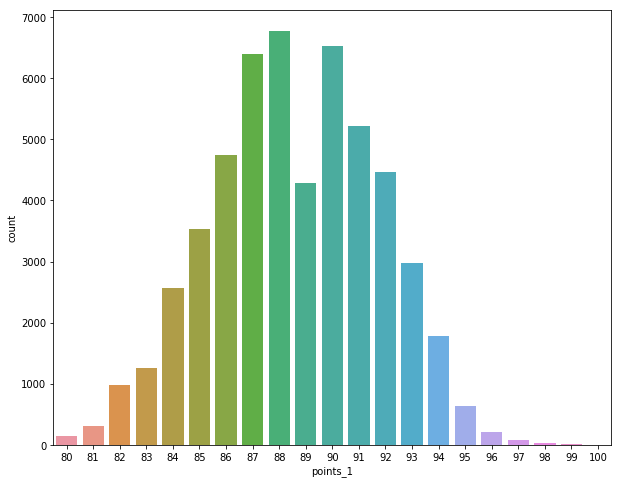

In [40]:
plt.figure(figsize = (10, 8))
ratings_histogram = sns.countplot(df_10['points_1'])
ratings_histogram

### Where region do wines originate from the most?
### Which areas have the highest rated wines.
### Which variety had the highest ratings, etc.
### Then you can go prediction.
### Is there a correlation between the price of wine and the rating?
### Or between the region and the rating or price?
### What type of wine has the highest price?
### Are there trends within each region? (correlation between price and points?)
### What effect does vintage have on price and rating?
### Is there any correlation or distinction between the east and west coast?
### What category of wine has the most reviews? what are the average ratings of these categories?
### Wine demographics. What are the most popular wine categories for different countries? (what's the red country and white country)
### What is more popular in the US? red or white? What about the world?
### What regions are dry regions? sweet?
### What country has the most reviews?


In [41]:
import mpl_toolkits

In [ ]:
import cartopy.crs as ccrs

Invalid argument (must be a Polygon)
Geometry must be a Point or LineString


In [1]:
wine_categories = df_10.groupby('category_1')

NameError: name 'df_10' is not defined

/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


<Figure size 720x576 with 0 Axes>

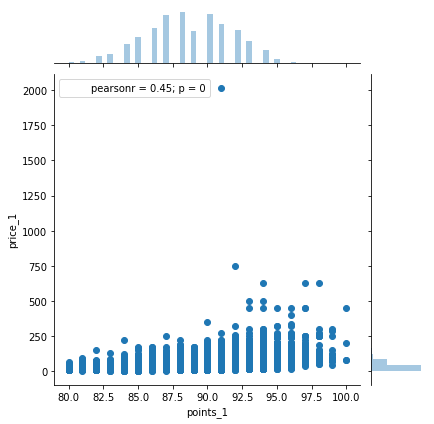

In [88]:
plt.figure(figsize = (10, 8))
price_rating_corr = sns.jointplot(df_10['points_1'], df_10['price_1'])

/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


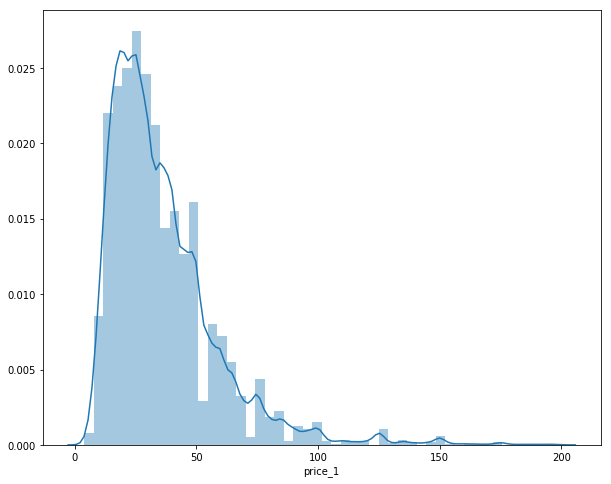

In [98]:
plt.figure(figsize = (10, 8))
price_histogram = sns.distplot(df_10.query('price_1 < 200').price_1)

/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


<Figure size 720x576 with 0 Axes>

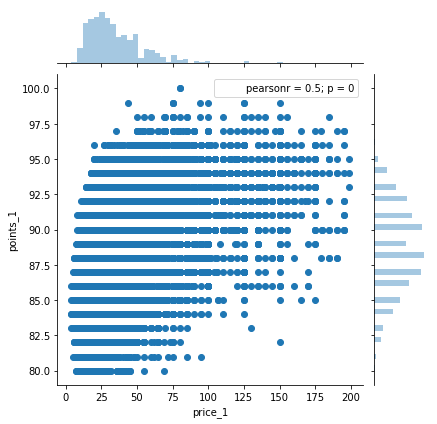

In [100]:
plt.figure(figsize = (10, 8))
price_rating_corr1 = sns.jointplot(df_10.query('price_1 < 200').price_1, df_10['points_1'])

/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


<Figure size 720x576 with 0 Axes>

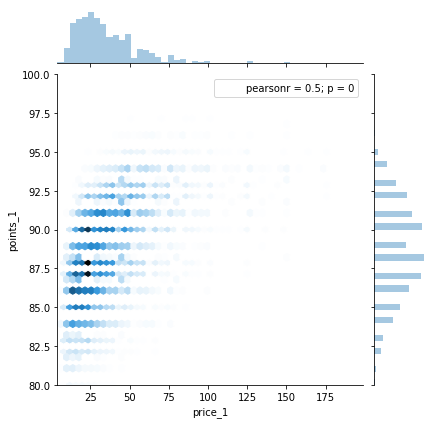

In [103]:
plt.figure(figsize = (10, 8))
price_rating_corr1 = sns.jointplot(df_10.query('price_1 < 200').price_1, df_10['points_1'], kind = 'hex')

/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/shachiakyaagba/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


<Figure size 720x576 with 0 Axes>

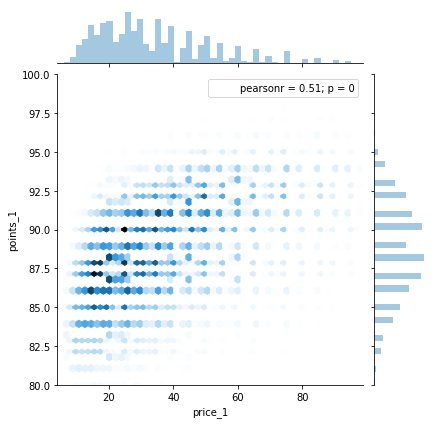

In [104]:
plt.figure(figsize = (10, 8))
price_rating_corr1 = sns.jointplot(df_10.query('price_1 < 100').price_1, df_10['points_1'], kind = 'hex')

In [31]:
df_10

,old_index_1,country_1,description_1,points_1,price_1,state_1,region_1_1,region_2_1,title_1,variety_1,winery_1,state_label_1,new_v2_1,category_1,cat_label_1
0,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,19,pinot gris,white_dry_floral,12
1,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,11,riesling,white_off_dry,16
2,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,19,pinot noir,red_dry_floral,3
3,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature,2,cabernet sauvignon,red_dry_herb,5
4,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini,2,cabernet sauvignon,red_dry_herb,5
5,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou,2,chardonnay,white_dry_sweet,14
6,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont,24,meritage,red_bone_dry_savory,2
7,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont,24,red blend,red_blend,0
8,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat,19,pinot noir,red_dry_floral,3
9,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi,2,merlot,red_dry_spice,6


[Text(0,0,'Willamette Valley'),
 Text(0,0,'Lake Michigan Shore'),
 Text(0,0,'Napa'),
 Text(0,0,'Sonoma'),
 Text(0,0,'Central Coast'),
 Text(0,0,'Virginia'),
 Text(0,0,'Oregon Other'),
 Text(0,0,'Central Valley'),
 Text(0,0,'Lake County'),
 Text(0,0,'Monticello'),
 Text(0,0,'North Coast'),
 Text(0,0,'Columbia Valley'),
 Text(0,0,'California Other'),
 Text(0,0,'Finger Lakes'),
 Text(0,0,'Anderson Valley'),
 Text(0,0,'Sierra Foothills'),
 Text(0,0,'Mendocino'),
 Text(0,0,'Cole Ranch'),
 Text(0,0,'Mendocino County'),
 Text(0,0,'New York Other'),
 Text(0,0,'Long Island'),
 Text(0,0,'Napa-Sonoma'),
 Text(0,0,'Southern Oregon'),
 Text(0,0,'Washington Other'),
 Text(0,0,'Idaho'),
 Text(0,0,'Texas'),
 Text(0,0,'South Coast'),
 Text(0,0,'Mendocino Ridge'),
 Text(0,0,'Texas High Plains'),
 Text(0,0,'Michigan'),
 Text(0,0,'Pennsylvania'),
 Text(0,0,'Old Mission Peninsula'),
 Text(0,0,'Leelanau Peninsula'),
 Text(0,0,'Outer Coastal Plain'),
 Text(0,0,"Virginia's Eastern Shore"),
 Text(0,0,'Red Hill

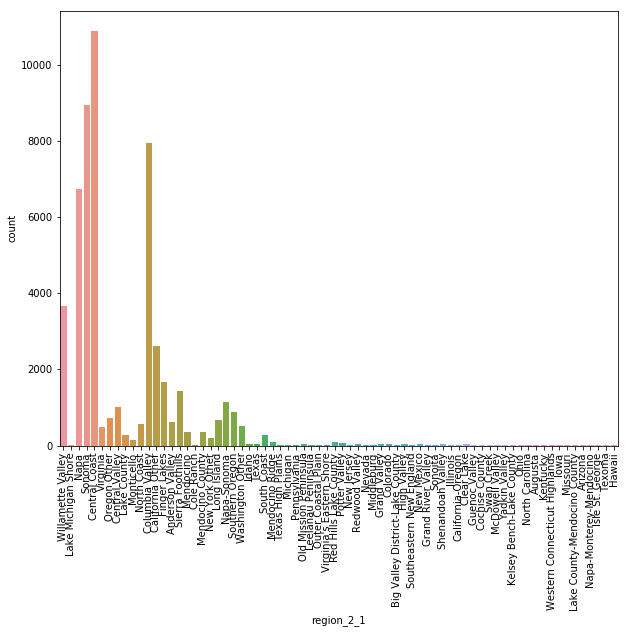

In [63]:
#Highest number of wines by region
plt.figure(figsize = (10, 8))
ratings_histogram = sns.countplot(df_10['region_2_1'])

ratings_histogram.set_xticklabels(ratings_histogram.get_xticklabels(),rotation=90)

In [82]:
pd.set_option('display.max_columns', 500)

In [133]:
categories_by_regions = pd.crosstab(df_10.category_1, df_10.state_1 )

categories_by_regions

state_1,Arizona,California,Colorado,Connecticut,Hawaii,Idaho,Illinois,Iowa,Kentucky,Massachusetts,...,New Jersey,New Mexico,New York,North Carolina,Ohio,Oregon,Pennsylvania,Texas,Virginia,Washington
category_1,,,,,,,,,,,,,,,,,,,,,
red_blend,10,1791,10,0,0,2,0,0,0,0,...,0,10,55,2,0,108,2,6,58,846
red_bone_dry_bitter,0,70,0,0,0,0,0,0,0,0,...,0,1,0,0,1,7,0,0,20,13
red_bone_dry_savory,2,1911,18,1,0,2,0,0,1,1,...,1,8,361,5,1,180,0,14,238,1194
red_dry_floral,8,9600,8,0,0,3,0,0,0,0,...,2,4,167,0,0,2973,4,4,11,1489
red_dry_fruit_vanilla,2,4171,6,0,0,1,0,0,0,0,...,0,1,16,0,0,120,0,10,5,528
red_dry_herb,1,6004,12,0,0,3,0,0,0,0,...,0,5,115,3,1,88,2,4,33,1553
red_dry_spice,0,1414,3,0,0,3,0,0,0,0,...,1,4,138,0,0,52,3,0,38,678
rose,0,511,1,0,0,0,0,1,0,0,...,0,0,135,2,0,89,0,6,27,124
sparkling,0,548,0,0,1,0,6,0,0,0,...,0,1,58,0,0,23,0,0,8,23


<Figure size 720x576 with 0 Axes>

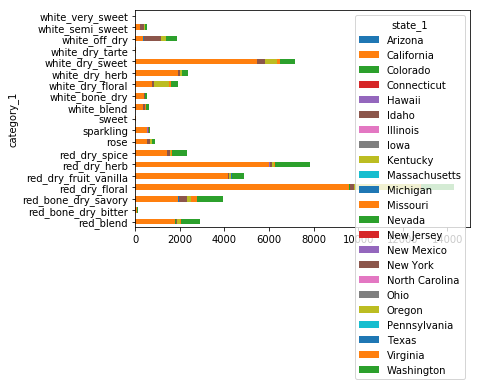

In [137]:
plt.figure(figsize = (10,8))
categories_by_regions.plot.barh(stacked = True)

In [86]:
#get variety and ratings
categories_by_points = pd.crosstab(df_10.category_1, df_10.points_1 )

categories_by_points

points_1,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100
category_1,,,,,,,,,,,,,,,,,,,,,
red_blend,16,34,76,99,185,218,299,381,424,260,334,252,166,100,45,10,9,1,0,1,0
red_bone_dry_bitter,1,0,3,4,6,7,9,18,11,14,11,10,5,8,4,1,0,0,0,0,0
red_bone_dry_savory,8,9,55,89,155,234,366,474,517,412,461,478,322,177,128,43,11,10,5,1,1
red_dry_floral,19,35,176,209,423,617,954,1380,1556,1145,1711,1782,1776,1322,805,246,88,32,10,4,2
red_dry_fruit_vanilla,26,55,130,151,290,350,435,580,669,397,627,443,391,213,74,23,5,2,0,0,0
red_dry_herb,24,46,137,156,363,509,652,884,860,540,1002,778,698,521,379,168,64,27,12,5,1
red_dry_spice,11,28,78,92,166,238,268,321,343,192,249,166,88,55,30,11,1,0,1,0,0
rose,4,9,27,37,71,65,117,128,144,93,125,51,23,2,1,0,1,0,0,0,0
sparkling,0,1,5,7,23,33,73,102,85,48,84,61,53,43,24,15,6,2,3,0,0


In [92]:
groups = df_10.groupby(['state_1'])

In [94]:
groups.size()

state_1
Arizona              37
California        35570
Colorado             68
Connecticut           3
Hawaii                1
Idaho                27
Illinois              6
Iowa                  2
Kentucky              1
Massachusetts         4
Michigan            101
Missouri             11
Nevada                4
New Jersey            8
New Mexico           42
New York           2522
North Carolina       17
Ohio                 12
Oregon             5266
Pennsylvania         16
Texas                71
Virginia            695
Washington         8448
dtype: int64

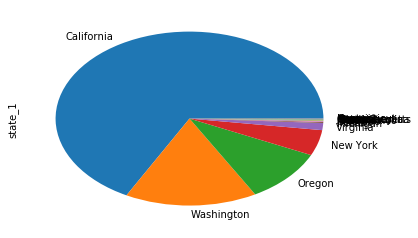

In [95]:
pie_states = df_10.state_1.value_counts().plot(kind='pie')

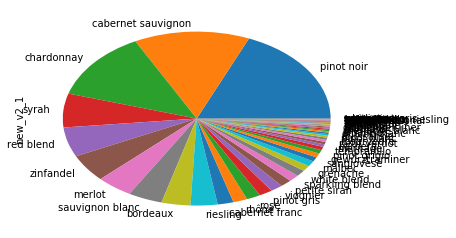

In [97]:
pie_variety = df_10.new_v2_1.value_counts().plot(kind='pie')

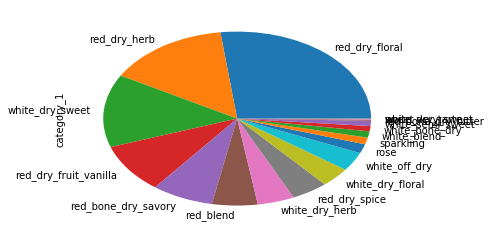

In [98]:
pie_wine_category = df_10.category_1.value_counts().plot(kind='pie')

In [111]:
#what variety had the highest rating?
category_groups = df_10.groupby('category_1', as_index=False)['points_1'].mean()


In [113]:
state_groups = df_10.groupby('state_1', as_index=False)['price_1'].mean()
state_groups

,state_1,price_1
0,Arizona,29.216216
1,California,39.158308
2,Colorado,32.985294
3,Connecticut,15.333333
4,Hawaii,28.000000
5,Idaho,17.185185
6,Illinois,32.333333
7,Iowa,13.000000
8,Kentucky,35.000000
9,Massachusetts,23.500000


In [114]:
# Are there trends within each region? (correlation between price and points?)
df_10['price_1'].corr(df_10['points_1'])

0.4526701310234392

In [117]:
year = df_10['title_1']
year

0            Rainstorm 2013 Pinot Gris (Willamette Valley)
1        St. Julian 2013 Reserve Late Harvest Riesling ...
2        Sweet Cheeks 2012 Vintner's Reserve Wild Child...
3        Kirkland Signature 2011 Mountain Cuvée Caberne...
4        Louis M. Martini 2012 Cabernet Sauvignon (Alex...
5                 Mirassou 2012 Chardonnay (Central Coast)
6                     Quiévremont 2012 Meritage (Virginia)
7            Quiévremont 2012 Vin de Maison Red (Virginia)
8                         Acrobat 2013 Pinot Noir (Oregon)
9        Bianchi 2011 Signature Selection Merlot (Paso ...
10       Castello di Amorosa 2011 King Ridge Vineyard P...
11       Clarksburg Wine Company 2010 Chenin Blanc (Cla...
12       Envolve 2010 Puma Springs Vineyard Red (Dry Cr...
13            Envolve 2011 Sauvignon Blanc (Sonoma Valley)
14              Erath 2010 Hyland Pinot Noir (McMinnville)
15       Hawkins Cellars 2009 Pinot Noir (Willamette Va...
16          Robert Hall 2011 Sauvignon Blanc (Paso Roble

In [136]:
# year_number = []
# for item in year:
#     digit = re.findall(r'[0-9]{4}', item)
#     year_number.append(digit)
year_number = [re.findall(r'[0-9]{4}', item) for item in year]
year_number

[['2013'],
 ['2013'],
 ['2012'],
 ['2011'],
 ['2012'],
 ['2012'],
 ['2012'],
 ['2012'],
 ['2013'],
 ['2011'],
 ['2011'],
 ['2010'],
 ['2010'],
 ['2011'],
 ['2010'],
 ['2009'],
 ['2011'],
 ['2010'],
 ['2011'],
 ['2011'],
 ['2010'],
 ['2010'],
 ['2014'],
 ['2013'],
 ['2014'],
 ['2015'],
 ['2013'],
 ['2014'],
 ['2014'],
 ['2013'],
 ['2013'],
 ['2012'],
 ['2013'],
 ['2015'],
 ['2014'],
 ['2016'],
 ['2014'],
 ['2014'],
 ['2015'],
 ['2013'],
 ['2014'],
 ['2015'],
 ['2013'],
 ['2015'],
 ['2014'],
 ['2014'],
 ['2014'],
 ['2013'],
 ['2012'],
 ['2013'],
 ['2013'],
 ['2014'],
 ['2007'],
 ['2007'],
 ['2006'],
 ['2007'],
 ['2007'],
 ['2013'],
 ['2013'],
 ['2010'],
 ['2012'],
 ['2013'],
 ['2013'],
 ['2012'],
 ['2012'],
 ['2013'],
 ['2013'],
 ['2014'],
 ['2013'],
 ['2012'],
 ['2014'],
 ['2014'],
 ['2005'],
 ['2006'],
 ['2006'],
 ['2007'],
 ['2006'],
 ['2013'],
 ['2014'],
 ['2014'],
 ['2015'],
 ['2014'],
 ['2014'],
 ['2014', '1105'],
 ['2014'],
 ['2015'],
 ['2014'],
 ['2006'],
 ['2006'],
 ['2005'],
 [

In [138]:
for item in year_number:
    if item == []:
        item.append(0)
year_number = [year[0] for year in year_number]

In [139]:
year_number

['2013',
 '2013',
 '2012',
 '2011',
 '2012',
 '2012',
 '2012',
 '2012',
 '2013',
 '2011',
 '2011',
 '2010',
 '2010',
 '2011',
 '2010',
 '2009',
 '2011',
 '2010',
 '2011',
 '2011',
 '2010',
 '2010',
 '2014',
 '2013',
 '2014',
 '2015',
 '2013',
 '2014',
 '2014',
 '2013',
 '2013',
 '2012',
 '2013',
 '2015',
 '2014',
 '2016',
 '2014',
 '2014',
 '2015',
 '2013',
 '2014',
 '2015',
 '2013',
 '2015',
 '2014',
 '2014',
 '2014',
 '2013',
 '2012',
 '2013',
 '2013',
 '2014',
 '2007',
 '2007',
 '2006',
 '2007',
 '2007',
 '2013',
 '2013',
 '2010',
 '2012',
 '2013',
 '2013',
 '2012',
 '2012',
 '2013',
 '2013',
 '2014',
 '2013',
 '2012',
 '2014',
 '2014',
 '2005',
 '2006',
 '2006',
 '2007',
 '2006',
 '2013',
 '2014',
 '2014',
 '2015',
 '2014',
 '2014',
 '2014',
 '2014',
 '2015',
 '2014',
 '2006',
 '2006',
 '2005',
 '2006',
 '2006',
 '2006',
 '2004',
 '2005',
 '2005',
 '2007',
 '2002',
 '2004',
 '2006',
 '2007',
 '2005',
 '2006',
 '2006',
 '2008',
 '2009',
 '2009',
 '2008',
 '2009',
 '2009',
 '2010',
 

In [141]:
df_10['vintage_1'] = year_number

In [155]:
def add_vintage(dataframe):
    year_list = [re.findall(r'[0-9]{4}', item) for item in dataframe['title_1']]
    for item in year_list:
        if item == []:
            item.append('0')
    year_list = [year[0] for year in year_list]
    dataframe['vintage_1'] = year_list
    return dataframe
    
    

In [156]:
add_vintage(df_10)

,old_index_1,country_1,description_1,points_1,price_1,state_1,region_1_1,region_2_1,title_1,variety_1,winery_1,state_label_1,new_v2_1,category_1,cat_label_1,vintage_1
0,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,19,pinot gris,white_dry_floral,12,2013
1,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,11,riesling,white_off_dry,16,2013
2,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,19,pinot noir,red_dry_floral,3,2012
3,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature,2,cabernet sauvignon,red_dry_herb,5,2011
4,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini,2,cabernet sauvignon,red_dry_herb,5,2012
5,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou,2,chardonnay,white_dry_sweet,14,2012
6,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont,24,meritage,red_bone_dry_savory,2,2012
7,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont,24,red blend,red_blend,0,2012
8,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat,19,pinot noir,red_dry_floral,3,2013
9,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi,2,merlot,red_dry_spice,6,2011


In [160]:
grouped_variety = df_10.groupby('new_v2_1', as_index = False)
grouped_variety

In [162]:
grouped_variety['price_1'].mean().sort_values('price_1')

,new_v2_1,price_1
17,johannisberg riesling,8.875000
23,moscato,14.019231
34,pinot grigio,15.119444
60,verdejo,18.250000
35,pinot gris,18.660798
25,muscat,19.181818
13,gewürztraminer,19.253071
42,riesling,19.505514
8,chenin blanc,19.694656
44,rosé,20.229563


In [165]:
vintage = df_10.groupby('vintage_1')

In [168]:
vintage['price_1']

vintage_1
0        21.120347
1000     19.000000
1070     25.000000
1621     28.000000
1789     48.000000
1840     75.000000
1850     24.000000
1852     18.421053
1856     36.666667
1985    170.000000
1986    170.000000
1987    170.000000
1989     14.000000
1990     40.000000
1991    160.000000
1992    102.500000
1994     49.500000
1995     22.000000
1996     49.923077
1997     44.373272
1998     26.410334
1999     27.833333
2000     24.482759
2001     24.569378
2002     22.157895
2003     47.738095
2004     44.720670
2005     40.382239
2006     35.283644
2007     36.855426
2008     38.200928
2009     38.021292
2010     37.456778
2011     35.449794
2012     39.958675
2013     39.891627
2014     37.140397
2015     29.478371
2016     21.994112
7200     42.500000
Name: price_1, dtype: float64

In [169]:
df_10

,old_index_1,country_1,description_1,points_1,price_1,state_1,region_1_1,region_2_1,title_1,variety_1,winery_1,state_label_1,new_v2_1,category_1,cat_label_1,vintage_1
0,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,19,pinot gris,white_dry_floral,12,2013
1,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,11,riesling,white_off_dry,16,2013
2,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,19,pinot noir,red_dry_floral,3,2012
3,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature,2,cabernet sauvignon,red_dry_herb,5,2011
4,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini,2,cabernet sauvignon,red_dry_herb,5,2012
5,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou,2,chardonnay,white_dry_sweet,14,2012
6,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont,24,meritage,red_bone_dry_savory,2,2012
7,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont,24,red blend,red_blend,0,2012
8,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat,19,pinot noir,red_dry_floral,3,2013
9,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi,2,merlot,red_dry_spice,6,2011


In [171]:
df_10


,old_index_1,country_1,description_1,points_1,price_1,state_1,region_1_1,region_2_1,title_1,variety_1,winery_1,state_label_1,new_v2_1,category_1,cat_label_1,vintage_1
0,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,19,pinot gris,white_dry_floral,12,2013
1,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,11,riesling,white_off_dry,16,2013
2,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,19,pinot noir,red_dry_floral,3,2012
3,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature,2,cabernet sauvignon,red_dry_herb,5,2011
4,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini,2,cabernet sauvignon,red_dry_herb,5,2012
5,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou,2,chardonnay,white_dry_sweet,14,2012
6,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont,24,meritage,red_bone_dry_savory,2,2012
7,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont,24,red blend,red_blend,0,2012
8,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat,19,pinot noir,red_dry_floral,3,2013
9,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi,2,merlot,red_dry_spice,6,2011


In [224]:
def binning(col, cut_points, labels=None):
  #Define min and max values:
  minval = col.min()
  maxval = col.max()

  #create list by adding min and max to cut_points
  break_points = [minval] + cut_points + [maxval]

  #if no labels provided, use default labels 0 ... (n-1)
  if not labels:
    labels = range(len(cut_points)+1)

  #Binning using cut function of pandas
  colBin = pd.cut(col,bins=break_points,labels=labels,include_lowest=True)
  return colBin

In [227]:
#Binning prices:
cut_points = [40,100]
labels = ["low","medium","high"]
prices = binning(prices, cut_points, labels)
print(pd.value_counts(prices, sort=False))

low       36672
medium    15232
high       1028
Name: price_1, dtype: int64


In [228]:
prices

0           low
1           low
2        medium
3           low
4           low
5           low
6           low
7           low
8           low
9           low
10       medium
11          low
12       medium
13          low
14       medium
15          low
16          low
17          low
18          low
19          low
20          low
21          low
22       medium
23       medium
24          low
25          low
26       medium
27          low
28          low
29          low
          ...  
52902       low
52903    medium
52904       low
52905       low
52906    medium
52907       low
52908       low
52909    medium
52910    medium
52911       low
52912       low
52913       low
52914       low
52915    medium
52916    medium
52917       low
52918       low
52919      high
52920    medium
52921    medium
52922       low
52923       low
52924       low
52925       low
52926       low
52927       low
52928       low
52929       low
52930       low
52931    medium
Name: price_1, Length: 5

In [209]:
df_10

,old_index_1,country_1,description_1,points_1,price_1,state_1,region_1_1,region_2_1,title_1,variety_1,winery_1,state_label_1,new_v2_1,category_1,cat_label_1,vintage_1
0,2,US,"Tart and snappy, the flavors of lime flesh and...",87,14.0,Oregon,Willamette Valley,Willamette Valley,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,19,pinot gris,white_dry_floral,12,2013
1,3,US,"Pineapple rind, lemon pith and orange blossom ...",87,13.0,Michigan,Lake Michigan Shore,Lake Michigan Shore,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,11,riesling,white_off_dry,16,2013
2,4,US,"Much like the regular bottling from 2012, this...",87,65.0,Oregon,Willamette Valley,Willamette Valley,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,19,pinot noir,red_dry_floral,3,2012
3,10,US,"Soft, supple plum envelopes an oaky structure ...",87,19.0,California,Napa Valley,Napa,Kirkland Signature 2011 Mountain Cuvée Caberne...,Cabernet Sauvignon,Kirkland Signature,2,cabernet sauvignon,red_dry_herb,5,2011
4,12,US,"Slightly reduced, this wine offers a chalky, t...",87,34.0,California,Alexander Valley,Sonoma,Louis M. Martini 2012 Cabernet Sauvignon (Alex...,Cabernet Sauvignon,Louis M. Martini,2,cabernet sauvignon,red_dry_herb,5,2012
5,14,US,Building on 150 years and six generations of w...,87,12.0,California,Central Coast,Central Coast,Mirassou 2012 Chardonnay (Central Coast),Chardonnay,Mirassou,2,chardonnay,white_dry_sweet,14,2012
6,19,US,"Red fruit aromas pervade on the nose, with cig...",87,32.0,Virginia,Virginia,Virginia,Quiévremont 2012 Meritage (Virginia),Meritage,Quiévremont,24,meritage,red_bone_dry_savory,2,2012
7,20,US,Ripe aromas of dark berries mingle with ample ...,87,23.0,Virginia,Virginia,Virginia,Quiévremont 2012 Vin de Maison Red (Virginia),Red Blend,Quiévremont,24,red blend,red_blend,0,2012
8,21,US,"A sleek mix of tart berry, stem and herb, alon...",87,20.0,Oregon,Oregon,Oregon Other,Acrobat 2013 Pinot Noir (Oregon),Pinot Noir,Acrobat,19,pinot noir,red_dry_floral,3,2013
9,23,US,This wine from the Geneseo district offers aro...,87,22.0,California,Paso Robles,Central Coast,Bianchi 2011 Signature Selection Merlot (Paso ...,Merlot,Bianchi,2,merlot,red_dry_spice,6,2011


In [192]:
##Correlation between price and points for the different states

corr1 = df_10.groupby('state_1')[['points_1','price_1']].corr()

In [190]:
##Correlation between price and points for the different states

corr = df_10.groupby('new_v2_1')[['points_1','price_1']].corr()
corr

points_1   price_1
new_v2_1                                       
aglianico          points_1  1.000000 -0.031343
                   price_1  -0.031343  1.000000
albariño           points_1  1.000000  0.269240
                   price_1   0.269240  1.000000
barbera            points_1  1.000000  0.212316
                   price_1   0.212316  1.000000
bordeaux           points_1  1.000000  0.450406
                   price_1   0.450406  1.000000
cabernet           points_1  1.000000  0.648121
                   price_1   0.648121  1.000000
cabernet franc     points_1  1.000000  0.378242
                   price_1   0.378242  1.000000
cabernet sauvignon points_1  1.000000  0.529480
                   price_1   0.529480  1.000000
chardonnay         points_1  1.000000  0.333938
                   price_1   0.333938  1.000000
chenin blanc       points_1  1.000000  0.382488
                   price_1   0.382488  1.000000
colombard          points_1  1.000000 -0.433890
                   price_1  -0.433890  1.000000
fumé blanc         points_1  1.000000  0.542852
                   price_1   0.542852  1.000000
g                  points_1  1.000000  0.461538
                   price_1   0.461538  1.000000
garnacha           points_1  1.000000 -0.170860
                   price_1  -0.170860  1.000000
gewürztraminer     points_1  1.000000  0.349505
                   price_1   0.349505  1.000000
grenache           points_1  1.000000  0.434837
                   price_1   0.434837  1.000000
...                               ...       ...
shiraz             points_1  1.000000  0.775056
                   price_1   0.775056  1.000000
sparkling blend    points_1  1.000000  0.624572
                   price_1   0.624572  1.000000
syrah              points_1  1.000000  0.393877
                   price_1   0.393877  1.000000
sémillon           points_1  1.000000  0.186324
                   price_1   0.186324  1.000000
tannat             points_1  1.000000  0.192812
                   price_1   0.192812  1.000000
tempranillo        points_1  1.000000  0.418432
                   price_1   0.418432  1.000000
torrontés          points_1  1.000000  0.153093
                   price_1   0.153093  1.000000
touriga nacional   points_1  1.000000  0.189329
                   price_1   0.189329  1.000000
trebbiano          points_1  1.000000  0.755929
                   price_1   0.755929  1.000000
verdejo            points_1  1.000000 -0.139122
                   price_1  -0.139122  1.000000
vermentino         points_1  1.000000  0.226482
                   price_1   0.226482  1.000000
viognier           points_1  1.000000  0.318134
                   price_1   0.318134  1.000000
white blend        points_1  1.000000  0.430128
                   price_1   0.430128  1.000000
white port         points_1       NaN       NaN
                   price_1        NaN       NaN
zinfandel          points_1  1.000000  0.377207
                   price_1   0.377207  1.000000

[132 rows x 2 columns]

In [2]:
import numpy as np
from sklearn.model_selection import train_test_split

In [3]:
 x_train, x_test, y_train, y_test = train_test_split(get_vect, prices, test_size=0.33, random_state=42)

NameError: name 'get_vect' is not defined

In [230]:
from sklearn.linear_model import LogisticRegression

In [231]:
logreg = LogisticRegression(C=1e5)
logreg.fit(x_train, y_train)

LogisticRegression(C=100000.0, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
          solver='liblinear', tol=0.0001, verbose=0, warm_start=False)

In [232]:
prediction = logreg.predict(x_test)
prediction

array(['low', 'low', 'medium', ..., 'low', 'low', 'low'], dtype=object)

In [233]:
from sklearn import metrics

In [234]:
metrics.accuracy_score(y_test, prediction)

0.7262422715823219

In [1]:

from sklearn import svm
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp

# Learn to predict each class against the other
classifier = OneVsRestClassifier(svm.SVC(kernel='linear', probability=True,
                                 ))
y_score = classifier.fit(x_train, y_train).decision_function(x_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
# Plot of a ROC curve for a specific class

plt.figure()
lw = 2
plt.plot(fpr[2], tpr[2], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[2])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

NameError: name 'x_train' is not defined

Pearson Correlation: (1.0, 0.0)
                            OLS Regression Results                            
Dep. Variable:               points_1   R-squared:                       0.661
Model:                            OLS   Adj. R-squared:                  0.661
Method:                 Least Squares   F-statistic:                 1.031e+05
Date:                Mon, 13 Aug 2018   Prob (F-statistic):               0.00
Time:                        14:06:29   Log-Likelihood:            -2.8389e+05
No. Observations:               52932   AIC:                         5.678e+05
Df Residuals:                   52931   BIC:                         5.678e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
price_1        1.573

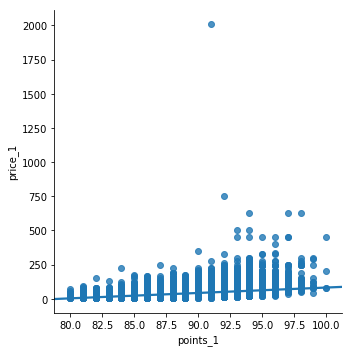

In [69]:
#Get possible correlation between price and points



from scipy.stats import pearsonr
import statsmodels.api as sm
print("Pearson Correlation:", pearsonr(df_10.price_1, df_10.price_1))
print(sm.OLS(df_10.points_1, df_10.price_1).fit().summary())
sns.lmplot(y = 'price_1', x='points_1', data=df_10)

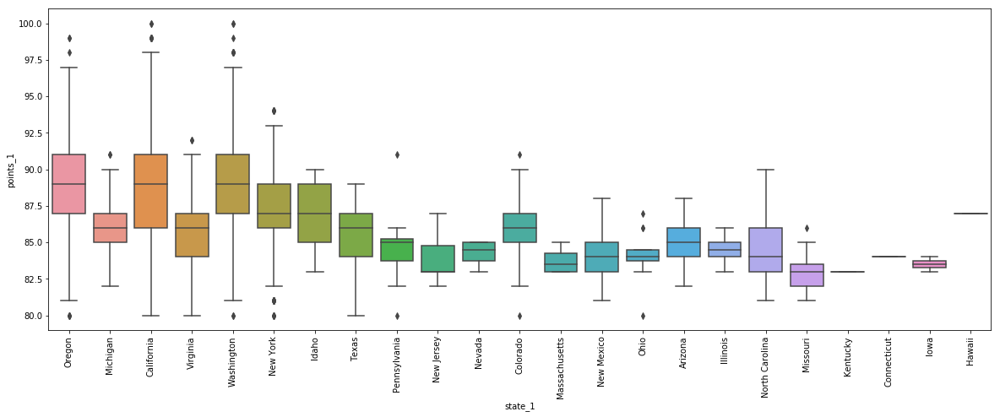

In [72]:
##distribution of points by state
fig, ax = plt.subplots(figsize = (20,7))
chart = sns.boxplot(x='state_1',y='points_1', data=df_10, ax = ax)
plt.xticks(rotation = 90)
plt.show()

In [73]:
#states and frequencies
df_10.state_1.value_counts()

California        35570
Washington         8448
Oregon             5266
New York           2522
Virginia            695
Michigan            101
Texas                71
Colorado             68
New Mexico           42
Arizona              37
Idaho                27
North Carolina       17
Pennsylvania         16
Ohio                 12
Missouri             11
New Jersey            8
Illinois              6
Nevada                4
Massachusetts         4
Connecticut           3
Iowa                  2
Hawaii                1
Kentucky              1
Name: state_1, dtype: int64

In [74]:
states_greater_than_10 = df_10.state_1.value_counts()[:15]
states_greater_than_10

California        35570
Washington         8448
Oregon             5266
New York           2522
Virginia            695
Michigan            101
Texas                71
Colorado             68
New Mexico           42
Arizona              37
Idaho                27
North Carolina       17
Pennsylvania         16
Ohio                 12
Missouri             11
Name: state_1, dtype: int64

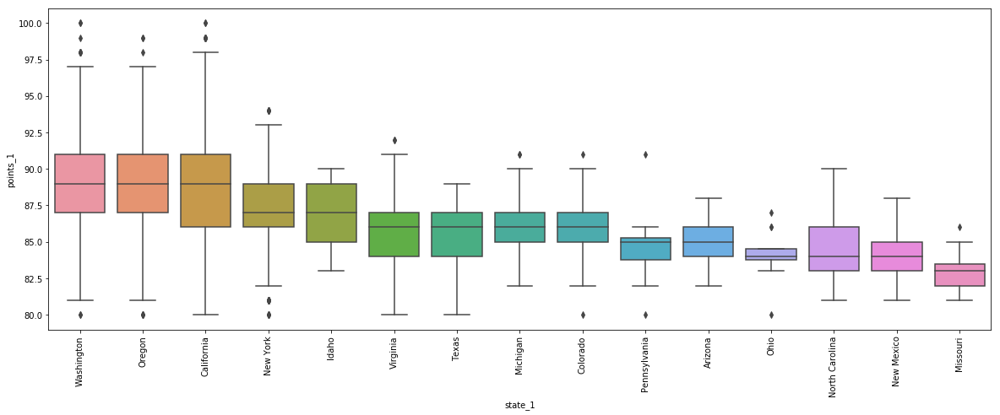

In [131]:
##more distinct segmentation once you get rid of the states with less than 10 reviews

states=df_10.groupby('state_1').filter(lambda x: len(x) >10)
df2 = pd.DataFrame({col:vals['points_1'] for col,vals in country.groupby('state_1')})
meds = df2.median()
meds.sort_values(ascending=False, inplace=True)

fig, ax = plt.subplots(figsize = (20,7))
chart = sns.boxplot(x='state_1',y='points_1', data=states, order=meds.index, ax = ax)
plt.xticks(rotation = 90)

plt.show()

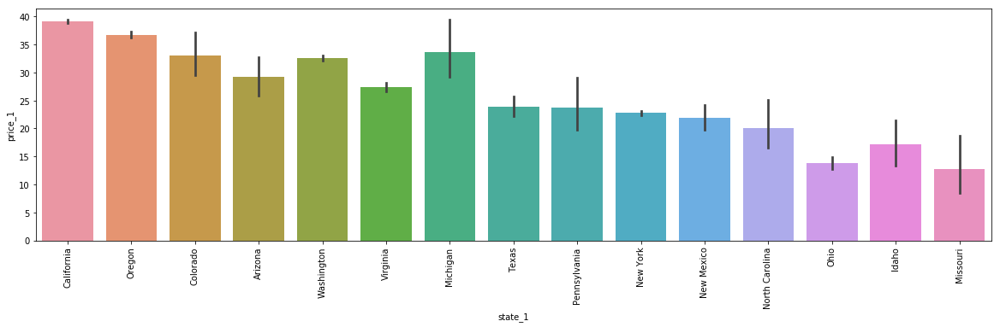

In [79]:
### plot mean price sorted by states in us
##Below are the average wine prices sorted by median (highest to lowest) in order to evaluate price distortions due to outliers.

df3 = pd.DataFrame({col:vals['price_1'] for col,vals in states.groupby('state_1')})
meds2 = df3.median()
meds2.sort_values(ascending=False, inplace=True)

fig, ax = plt.subplots(figsize = (20,5))
chart = sns.barplot(x='state_1',y='price_1', data=states, order=meds2.index, ax = ax)
plt.xticks(rotation = 90)
plt.show()

In [80]:
# medians for the above barplot
print(meds2)

California        33.0
Oregon            30.0
Colorado          30.0
Arizona           30.0
Washington        29.0
Virginia          25.0
Michigan          25.0
Texas             22.0
Pennsylvania      20.5
New York          20.0
New Mexico        20.0
North Carolina    18.0
Ohio              15.0
Idaho             14.0
Missouri           9.0
dtype: float64


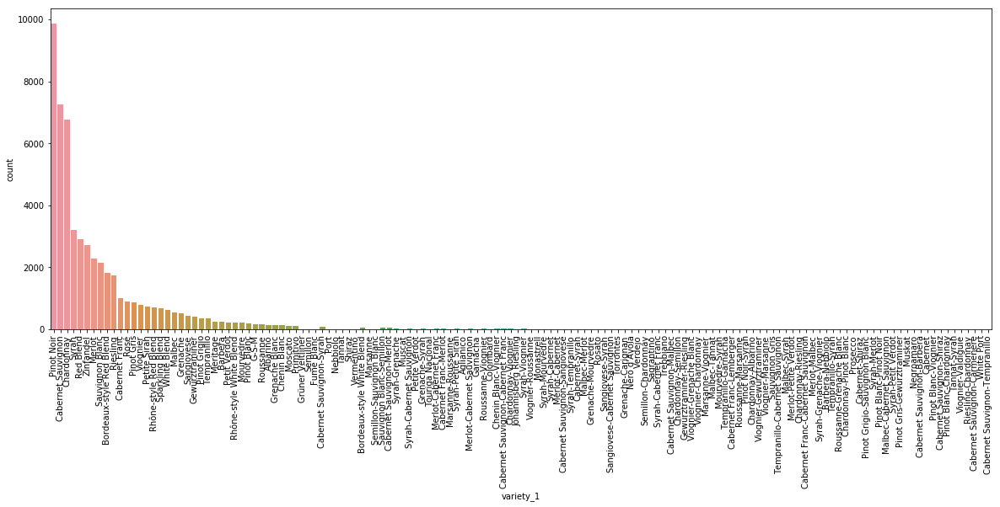

In [83]:
##Distribution of wines by variety

variety_groups = df_10.groupby('new_v2_1').filter(lambda x: len(x) >100)
list_ = df_10.variety_1.value_counts().index.tolist()
fig4, ax4 = plt.subplots(figsize = (20,7))
sns.countplot(x='variety_1', data=variety_groups, order = list_, ax=ax4)
plt.xticks(rotation = 90)
plt.show()

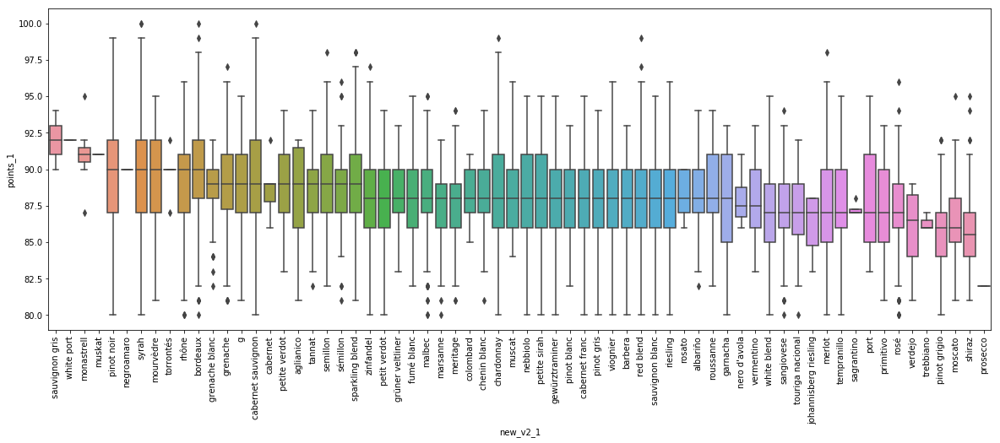

In [94]:
##BOXPLOT OF POINTS GROUPED BY WINE VARIETIES THAT OCCUR MORE THAN 200 TIMES

variety_groups1 = df_10.groupby('new_v2_1').filter(lambda x: len(x) >200)

df4 = pd.DataFrame({col:vals['points_1'] for col,vals in df_10.groupby('new_v2_1')})
meds3 = df4.median()
meds3.sort_values(ascending=False, inplace=True)

fig3, ax3 = plt.subplots(figsize = (20,7))
chart = sns.boxplot(x='new_v2_1',y='points_1', data=df_10, order=meds3.index, ax = ax3)
plt.xticks(rotation = 90)
plt.show()

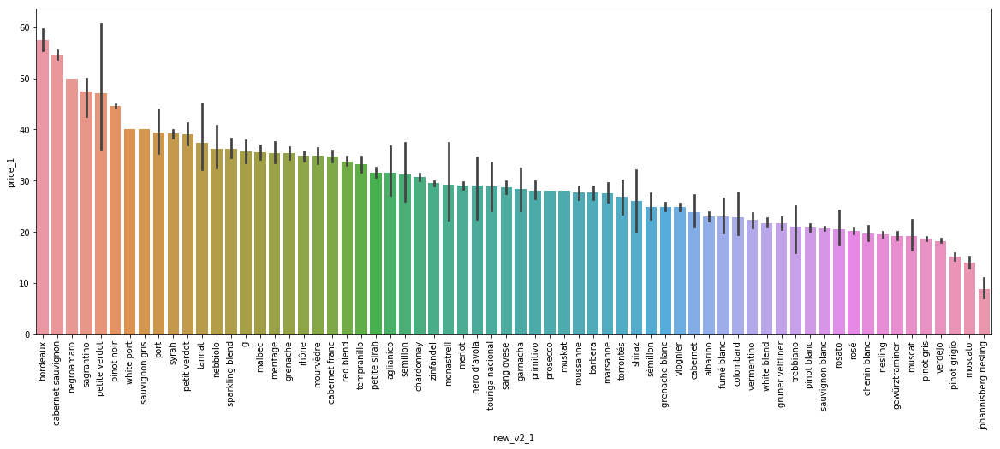

In [96]:
##DISTRIBUTION OF AVERAGE PRICES BY WINE VARIETY


df6 = pd.DataFrame({col:vals['price_1'] for col,vals in df_10.groupby('new_v2_1')})
mean2 = df6.mean()
mean2.sort_values(ascending=False, inplace=True)

fig3, ax3 = plt.subplots(figsize = (20,7))
chart = sns.barplot(x='new_v2_1',y='price_1', data=df_10, order=mean2.index, ax = ax3)
plt.xticks(rotation = 90)
plt.show()



## Modeling: Logistic Regression: Predicting price group based on Description

In [98]:
from sklearn.model_selection import train_test_split

In [101]:
from sklearn.model_selection import train_test_split
def binning(col, cut_points, labels=None):
 #Define min and max values:
 minval = col.min()
 maxval = col.max()

 #create list by adding min and max to cut_points
 break_points = [minval] + cut_points + [maxval]

 #if no labels provided, use default labels 0 ... (n-1)
 if not labels:
   labels = range(len(cut_points)+1)

 #Binning using cut function of pandas
 colBin = pd.cut(col,bins=break_points,labels=labels,include_lowest=True)
 return colBin

In [122]:
#Binning prices:
cut_points = [15,40,100]
labels = ['cheap',"low","medium","high"]
prices = binning(df_10['price_1'], cut_points, labels)
print(pd.value_counts(prices, sort=False))

cheap      6448
low       30224
medium    15232
high       1028
Name: price_1, dtype: int64


In [123]:
#get train and test set
x_train, x_test, y_train, y_test = train_test_split(get_vect, prices)


In [124]:
#FIT LOGISTIC REGRESSION MODEL IN TRAINING DATA

from sklearn.linear_model import LogisticRegression


model = LogisticRegression()
model.fit(x_train, y_train)




LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [126]:
#GET PREDICTIONS FOR EACH CLASS WITH THEIR PROBABILITIES
prediction = model.predict_proba(x_test)
prediction

array([[0.04436641, 0.00878304, 0.29788649, 0.64896406],
       [0.04162969, 0.01059712, 0.54270076, 0.40507243],
       [0.01399262, 0.00847322, 0.73731879, 0.24021537],
       ...,
       [0.10895562, 0.01330077, 0.55012208, 0.32762152],
       [0.01397477, 0.01635176, 0.69472801, 0.27494547],
       [0.04036774, 0.01157091, 0.54165445, 0.4064069 ]])

In [127]:
prediction2 = model.predict(x_test)
prediction2

array(['medium', 'low', 'low', ..., 'low', 'low', 'low'], dtype=object)

In [128]:
from sklearn import metrics
metrics.accuracy_score(y_test, prediction2)

0.6699161187939243

In [129]:


comparison = pd.DataFrame({'actual':y_test, 'predicted':prediction2})   

print('Accuracy Score:',metrics.accuracy_score(comparison.actual, comparison.predicted)*100,"%")
comparison

Accuracy Score: 66.99161187939244 %


,actual,predicted
2748,low,medium
31455,low,low
18723,low,low
29326,low,low
30505,medium,low
30241,low,low
24961,low,low
8128,low,low
35107,cheap,low
28095,cheap,low


In [140]:
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [141]:
?WordCloud

In [167]:
type(final_list['description'])

pandas.core.series.Series

In [172]:
text = ''
for item in final_list['description']:
    text = text + item
text

'Tart and snappy, the flavors of lime flesh and rind dominate. Some green pineapple pokes through, with crisp acidity underscoring the flavors. The wine was all stainless-steel fermented.Pineapple rind, lemon pith and orange blossom start off the aromas. The palate is a bit more opulent, with notes of honey-drizzled guava and mango giving way to a slightly astringent, semidry finish.Much like the regular bottling from 2012, this comes across as rather rough and tannic, with rustic, earthy, herbal characteristics. Nonetheless, if you think of it as a pleasantly unfussy country wine, it\'s a good companion to a hearty winter stew.Soft, supple plum envelopes an oaky structure in this Cabernet, supported by 15% Merlot. Coffee and chocolate complete the picture, finishing strong at the end, resulting in a value-priced wine of attractive flavor and immediate accessibility.Slightly reduced, this wine offers a chalky, tannic backbone to an otherwise juicy explosion of rich black cherry, the wh

In [173]:

wordcloud = WordCloud().generate(text)
wordcloud

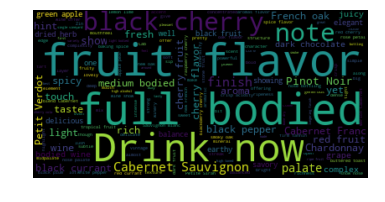

In [174]:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [221]:
wine_mask = np.array(Image.open("wine2.png"))
wine_mask

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [233]:
wordcloud_usa = WordCloud(stopwords=STOPWORDS, background_color="white", mode="RGBA", max_words=1000, mask=wine_mask).generate(text)

# create coloring from image
image_colors = ImageColorGenerator(wine_mask)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_usa.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

# store to file
plt.savefig("img/us_wine.png", format="png")

plt.show()

NotImplementedError: Gray-scale images TODO

<Figure size 504x504 with 0 Axes>

In [223]:
image_colors = ImageColorGenerator(wine_mask)

In [227]:
wordcloud_color = WordCloud(stopwords=STOPWORDS, background_color="white", max_words=1000, mask=wine_mask).generate(text)

In [230]:
image_colors = ImageColorGenerator(wine_mask)
plt.figure(figsize=[7,7])
plt.imshow(wordcloud_color.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

# store to file
plt.savefig("img/ita_wine.png", format="png")

plt.show()

NotImplementedError: Gray-scale images TODO

<Figure size 504x504 with 0 Axes>

In [217]:
def transform_format(val):
    if val == 0:
        return 255
    else:
        return val

In [218]:
# Transform your mask into a new one that will work with the function:
transformed_wine_mask = np.ndarray((wine_mask.shape[0],wine_mask.shape[1]), np.int32)

In [219]:
# Transform your mask into a new one that will work with the function:
transformed_wine_mask = np.ndarray((wine_mask.shape[0],wine_mask.shape[1]), np.int32)

for i in range(len(wine_mask)):
    transformed_wine_mask[i] = list(map(transform_format, wine_mask[i]))

In [220]:
# Check the expected result of your mask
transformed_wine_mask

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=int32)

In [213]:
wc = WordCloud(background_color="white", max_words=1000, mask=transformed_wine_mask,
               stopwords=STOPWORDS, contour_width=, contour_color='black')

In [214]:
wc.generate(text)

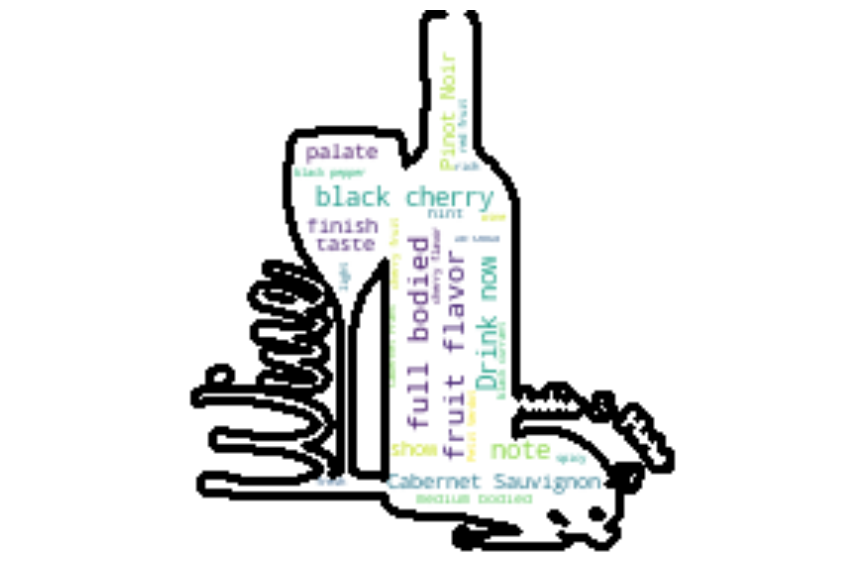

In [215]:
plt.figure(figsize=[20,10])
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()